In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "3"  
import sys
BASE_PATH = os.path.join(
   '/home/tzhouaq/ManGO_MOO/'
)
sys.path.append(BASE_PATH)
sys.path.append(os.path.join(BASE_PATH, 'off_moo_baselines'))
import logging
import numpy as np
import torch
from matplotlib import pyplot as plt
import pandas as pd 
import datetime 
import json 
import copy
import wandb
CONDITIONAL_TASKS = []
 
import off_moo_bench as ob
from mango_utliz import save_uncon_results, plot_scatter, plot_line,  save_indicators, get_best_result, get_device
from end2end_diffusion.SDE import DiffusionMOO
from utils import set_seed
from off_moo_baselines.end2end.nets import End2EndMultiHeadModel
from off_moo_baselines.end2end.trainer import get_trainer
from off_moo_baselines.end2end.surrogate_problem import End2EndSurrogateProblem
from off_moo_baselines.data import tkwargs, get_dataloader
from off_moo_bench.task_set import *
 

Auto Configuration Succeed!, Using database /home/tzhouaq/ManGO_MOO/off_moo_bench/problem/mo_nas/database.
Configuration Succeed!
Auto Configuration Succeed!, Using database /home/tzhouaq/ManGO_MOO/off_moo_bench/problem/mo_nas/database.


/home/tzhouaq/anaconda3/envs/mango4moo/lib/python3.8/site-packages/sklearn/utils/multiclass.py:13: DeprecationWarning: Please use `spmatrix` from the `scipy.sparse` namespace, the `scipy.sparse.base` namespace is deprecated.
  from scipy.sparse.base import spmatrix


/home/tzhouaq/ManGO_MOO/off_moo_bench/problem/lambo/data/experiments/test/regex_problem.pkl


wandb: WARNING W&B installed but not logged in.  Run `wandb login` or set the WANDB_API_KEY env variable.
wandb: WARNING W&B installed but not logged in.  Run `wandb login` or set the WANDB_API_KEY env variable.


In [2]:
from utils import process_args 
sys.argv = ['--model=End2End', '--train_mode=Vallina','--task=dtlz7','--use_wandb=False','--n_epochs=10','--retrain_model=False','--seed=1000']
config = process_args(return_dict=True)

results_dir = os.path.join('/home/tzhouaq/ManGO_MOO/', "results")
model_save_dir = os.path.join('/home/tzhouaq/ManGO_MOO/', "model")
 
config["results_dir"] = results_dir
config["model_save_dir"] = model_save_dir
config["data_pruning"] = True
config['data_preserved_ratio']= 1.0
config['hidden_size']=2048
config['inverse_lr']=1e-4
# config['batch_size']= 16
config['inverse_lr_decay']=0.98
config['n_epochs']= 200

config['simple_clip']=True
config['debais']=True
config["record_hist"]=False
config['dropout']=0. 
config['augment']=True
config['condition_training']=False
config['model_ckpt'] = None 
# config['normalize_xs'] = False
# config['normalize_ys'] = False

All config: {'results_dir': './results', 'model_save_dir': './model', 'use_wandb': False, 'run_type': 'train', 'seed': 1000, 'retrain_model': False, 'num_solutions': 256, 'solver_n_gen': 50, 'solver_init_method': 'nds', 'model': 'End2End', 'train_mode': 'Vallina', 'task': 'dtlz7', 'n_epochs': 10, 'data_pruning': False, 'batch_size': 128, 'forward_lr': 0.001, 'forward_lr_decay': 0.98, 'normalize_xs': True, 'normalize_ys': True, 'to_logits': False, 'record_hist': True}


In [3]:
# initialise task
if config["task"] in ALLTASKSDICT.keys():
    config["task"] = ALLTASKSDICT[config["task"]]
results_dir = os.path.join(config['results_dir'], 
                            f"{config['model']}-{config['train_mode']}-{config['task']}")
config["results_dir"] = results_dir 

ts = datetime.datetime.utcnow() + datetime.timedelta(hours=+8)
ts_name = f"-ts-{ts.year}-{ts.month}-{ts.day}_{ts.hour}-{ts.minute}-{ts.second}"
run_name = f"Ours-{config['model']}-{config['train_mode']}-seed{config['seed']}-{config['task']}"

logging_dir = os.path.join(config['results_dir'], run_name + ts_name)
os.makedirs(logging_dir, exist_ok=True)

if config['use_wandb']:
    if 'wandb_api' in config.keys():
        wandb.login(key=config['wandb_api'])

    wandb.init(
        project="ManGO_MOO",
        name=run_name + ts_name,
        config=config,
        group=f"{config['model']}-{config['train_mode']}",
        job_type=config['run_type'],
        mode="online",
        dir=os.path.join(config['results_dir'], '..')
    )

with open(os.path.join(logging_dir, "params.json"), "w") as f:
    json.dump(config, f, indent=4)

set_seed(config['seed'])
os.environ["SEED"] = f"{config['seed']}"

task = ob.make(config['task'])
# dataset_dic = {"dataset_max_percentile": 0.25, "dataset_min_percentile": 0} #取[1-dataset_max_percentile,1-dataset_min_percentile]区位的数据
# task = ob.make(config['task'],dataset_kwargs=dataset_dic, subsample=True)
# task.y.shape
x_min, x_max, y_min, y_max = task.dataset.get_xy_min_max()
x_lbound = x_min#task.problem.xl
x_ubound = x_max#task.problem.xu
print('x_min:', x_min, '\n', 'x_max:',x_max, '\n','y_min:',y_min,'\n', 'y_max:',y_max)
print('x_lbound:', x_lbound, '\n', 'x_ubound:',x_ubound)


x_min: [1.80047270e-08 5.11191256e-07 9.42811354e-06 3.28418130e-06
 1.01872190e-05 1.20401541e-05 1.15329200e-06 1.77805996e-06
 1.86658838e-05 6.03086081e-06] 
 x_max: [0.9999954  0.99999772 0.99992721 0.99999403 0.99999414 0.99999808
 0.99998904 0.99999631 0.99997255 0.99999953] 
 y_min: [1.80047270e-08 5.11191256e-07 4.40902012e+00] 
 y_max: [ 0.9999954   0.99999772 30.79227037]
x_lbound: [1.80047270e-08 5.11191256e-07 9.42811354e-06 3.28418130e-06
 1.01872190e-05 1.20401541e-05 1.15329200e-06 1.77805996e-06
 1.86658838e-05 6.03086081e-06] 
 x_ubound: [0.9999954  0.99999772 0.99992721 0.99999403 0.99999414 0.99999808
 0.99998904 0.99999631 0.99997255 0.99999953]


In [4]:
#There are some issues with the normalization implemented by benchmark. Here, let's avoid them to obtaine X and Y directly.
X = task.x.copy()
y = task.y.copy()
 

X_test = copy.deepcopy(task.x_test)
y_test = copy.deepcopy(task.y_test)

 
len_data = task.x.shape[0]
 
if config["data_pruning"]:
    X, y = task.get_N_non_dominated_solutions(
        N=int(len_data * config["data_preserved_ratio"]),
        return_x=True, return_y=True
    )

if config['to_logits']:
    assert task.is_discrete 
    task.map_to_logits()
    X = task.to_logits(X)
    X_test = task.to_logits(X_test)
if config['normalize_xs']:
    task.map_normalize_x()
    # X = copy.deepcopy(X)
    X = task.normalize_x(X)
    X_test = task.normalize_x(X_test)
    x_lbound = task.normalize_x(x_lbound)
    x_ubound = task.normalize_x(x_ubound)
    x_min = task.normalize_x(x_min)
    x_max = task.normalize_x(x_max)

#since the used version of pymoo do not have the pf of dtlz7, so we collect the pf via the latest version of pymoo and save it to use here.
name_task =config["task"].lower().split('-')[0]
path = f"/home/tzhouaq/ManGO_MOO/off_moo_bench/problem/pareto_fronts/reference_points_{name_task}.npy"
pf = np.load(path)
random_indices = np.random.choice(pf.shape[0], 500, replace=False)
pf = pf[random_indices]

if config['normalize_ys']:
    task.map_normalize_y()
    y = task.normalize_y(y)
    y_test = task.normalize_y(y_test)
    pf = task.normalize_y(pf)
    y_min = task.normalize_y(y_min)
    y_max = task.normalize_y(y_max)

 
if config['to_logits']:
    data_size, n_dim, n_classes = tuple(X.shape)
    X = X.reshape(-1, n_dim * n_classes)
    X_test = X_test.reshape(-1, n_dim * n_classes)
else:
    data_size, n_dim = tuple(X.shape)
n_obj = y.shape[1]

X.shape, y.shape, X_test.shape, y_test.shape


((60000, 10), (60000, 3), (40000, 10), (40000, 3))

In [5]:
#This cell is to train or load the forward model
config['retrain_model']=False
config['n_epochs']= 200
config['batch_size']= 32
config["train_mode"] = "gradnorm"
config["gradient_alpha"] = 0.12
model_save_dir = config['model_save_dir']
config["weight_lr"] = 5e-4
config['weight_lr_decay']=0.99
model_save_dir = config['model_save_dir']
os.makedirs(model_save_dir, exist_ok=True)

model_save_path = os.path.join(
    model_save_dir,
    f"{config['model']}-{config['train_mode']}-{config['task']}-{config['seed']}.pt"
)
model = End2EndMultiHeadModel(
    n_dim=n_dim * n_classes if config['to_logits'] else n_dim,
    n_obj=n_obj,
    hidden_size=[2048, 2048],
    save_path=model_save_path,
).to(**tkwargs)

trainer_func = get_trainer(config["train_mode"])

trainer = trainer_func(
    forward_model=model, 
    config=config
)

(
    train_loader,
    val_loader,
    test_loader
) = get_dataloader(X, y, X_test, y_test,
                    val_ratio=0.01,
                    batch_size=config["batch_size"])

trainer.launch(
    train_loader,
    val_loader,
    test_loader,
    retrain_model=config["retrain_model"]
)


#attain the surrogate problem
surrogate_problem = End2EndSurrogateProblem(
    n_var=n_dim * n_classes if config['to_logits'] else n_dim, n_obj=n_obj, model=model
)
 

Successfully load trained model from /home/tzhouaq/ManGO_MOO/model/End2End-gradnorm-DTLZ7-Exact-v0-1000.pt with valid MSE = 0.0002945327723864466


In [6]:
from end2end_diffusion.mango_training import mango_train

print(config['inverse_lr'])
CONDITIONAL_TASKS = []
if config['augment']:

    clip_min = torch.tensor(np.concatenate((x_lbound, y_min)))
    clip_max = torch.tensor(np.concatenate((x_ubound, y_max)))
else:
    clip_min = torch.tensor(x_min)
    clip_max = torch.tensor(x_max)

clip_dic = {'simple_clip': config['simple_clip'], 'clip_min': clip_min , 'clip_max': clip_max}
print(clip_dic)

try:
    inverse_model
except NameError:
    inverse_model = None 

# inverse_model = None
# config['n_epochs']=400
# # # # # clip_dic['simple_clip']=True
# inverse_model = mango_train(
#     task=task,
#     X=X,
#     y=y,
#     forward_model=model,
#     inverse_model=inverse_model,
#     hidden_size=config['hidden_size'],
#     lr=config['inverse_lr'],
#     dropout=config['dropout'],
#     device='auto',
#     seed=config['seed'],
#     num_epochs= config['n_epochs'],
#     ckpt_dir=config['model_save_dir'],
#     score_matching=True,
#     # data_preserved_ratio=config['data_preserved_ratio'],  
#     clip_dic=clip_dic,
#     # debais=config['debais'],
#     augment=config['augment'],
#     condition_training=config['condition_training']
# )


0.0001
{'simple_clip': True, 'clip_min': tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       dtype=torch.float64), 'clip_max': tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       dtype=torch.float64)}


In [7]:
# load the pretrained model
model_ckpt = '/home/tzhouaq/ManGO_MOO/model/ours-dtlz7-seed1000-hidden2048-score_matchingTrue.ckpt' #e=1000, 0.2*full data

inverse_model = DiffusionMOO.load_from_checkpoint(
    model_ckpt,
    taskname=task.dataset_name,
    task=task,
    learning_rate=config['inverse_lr'],
    dropout_p=config['dropout'],
    hidden_size=config['hidden_size'],
    simple_clip=clip_dic['simple_clip'],
    clip_min= clip_dic['clip_min'],
    clip_max= clip_dic['clip_max'],
    debais=config['debais'],
    augment=config['augment'],
    forwardmodel=model,
    condition_training=False
)


uncondition_training T: {1.0}


{'simple_clip': True, 'clip_min': tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       dtype=torch.float64), 'clip_max': tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       dtype=torch.float64)}
Hypervolume (100th): 9.744225
Ideal Hypervolume: 10.648000
L2 dist between design score and given y: 3.792031445295882
L2 dist between generated and given y: 11.374008642296841
Best design is: 
 [0.35307798 0.27228603 0.59254074 0.40271637 0.68173575 0.3175158
 0.51823455 0.4305638  0.49518383 0.4796446  0.35454518 0.27247727
 0.53637487]
Best design score is: 
 [0.35307959 0.27228628 0.5346759 ]
Best design score in training set: 
 [0.17175994 0.03614133 0.68930762]
Oracle design score is: 
 [ 4.87938563e-18 -4.10363937e-16 -1.17041166e-10]
Distance between the best to oracle value in training set is :
 0.7113035005189977
Distance between the best to oracle value is :
 0.6961920219885227
Hypervolume (100th): 7.460361
Hypervolume (75th): 7.406099
Hypervolume (50th

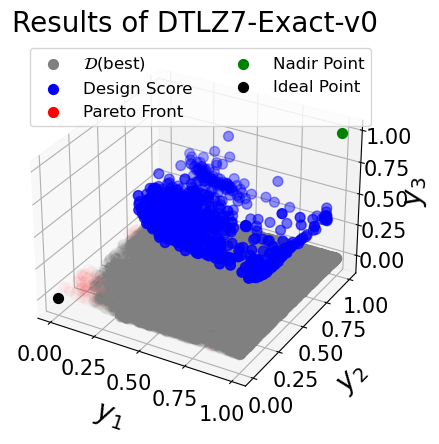

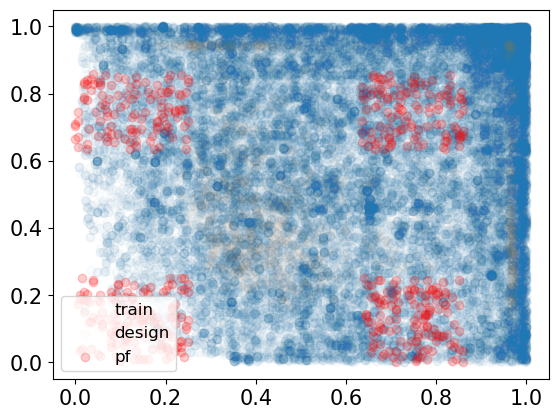

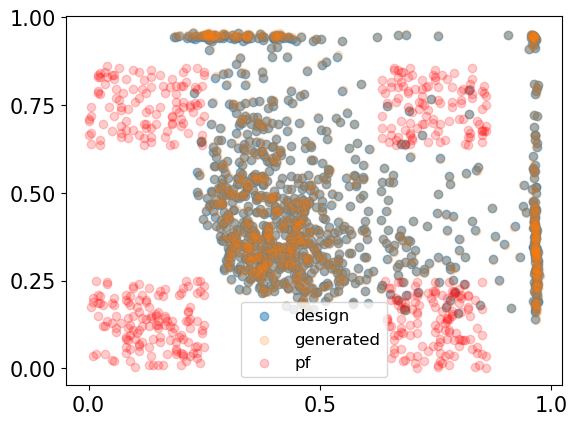

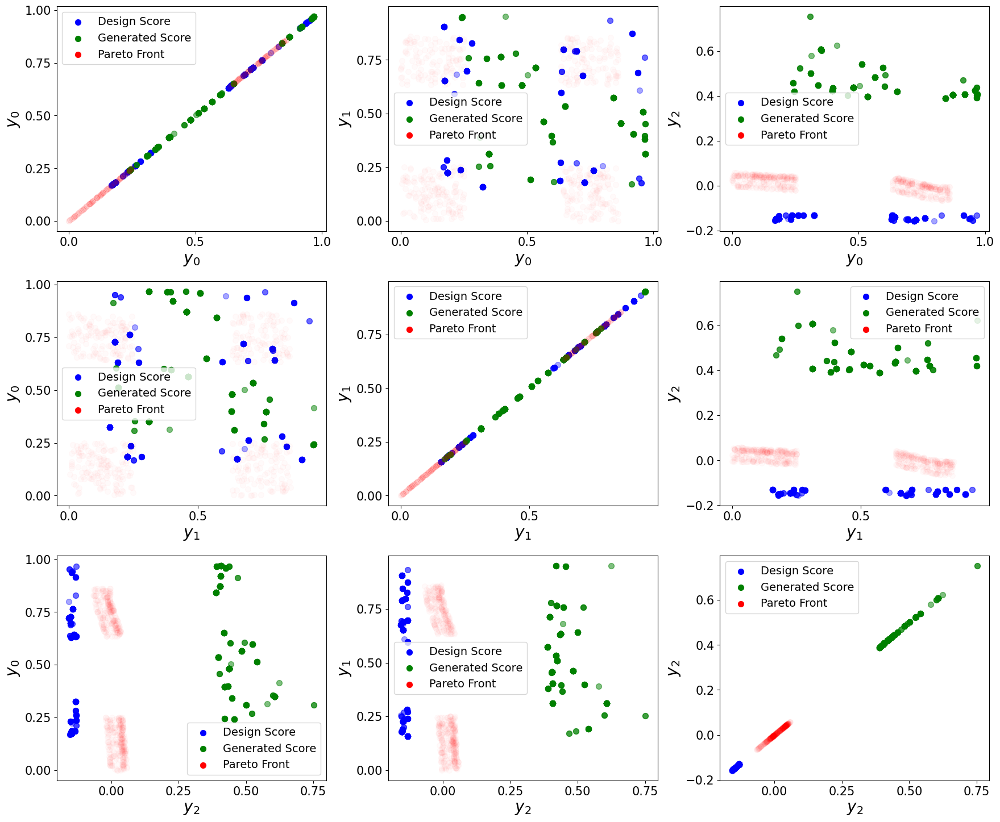

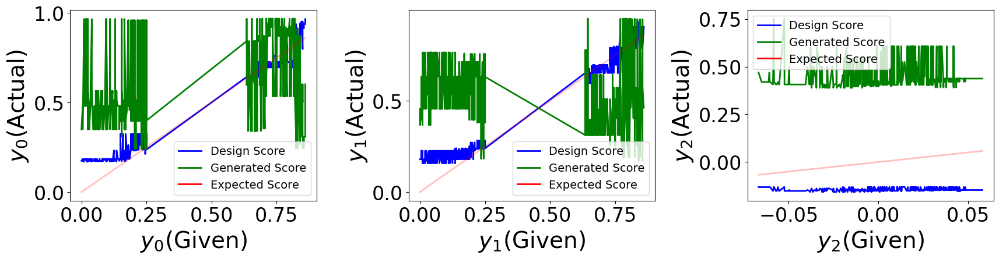

In [8]:
#This cell is to conduct unconditional generation 
from end2end_diffusion.mango_eval_is import mango_eval, fixed_random_seed

if config['augment']:
    # pf = task.problem.get_pareto_front() 
    # if config['normalize_ys']:
    #     pf = task.normalize_y(pf)
    y_min = np.minimum(y_min, pf.min(axis=0))
    y_max = np.maximum(y_max, pf.max(axis=0))
    clip_min = torch.tensor(np.concatenate((x_min, y_min)))#x_lbound
    clip_max = torch.tensor(np.concatenate((x_max, y_max)))#x_ubound
else:
    clip_min = torch.tensor(x_min)
    clip_max = torch.tensor(x_max)
print(clip_dic)


num_samples = 1000
 
res = mango_eval(
    task=task,
    forwardmodel=model,
    inverse_model=inverse_model,
    device='auto',
    num_samples=num_samples,#config['num_solutions'],
    # seed=config['seed'],
    logging_dir=logging_dir,
    ckpt_dir=config['model_save_dir'],
    augment=config['augment'],
    clip_dic=clip_dic,
    # gamma=0,
    condition_training=config['condition_training'],
    # gen_condition=y_given,
    num_steps=1000
    # guidance=True
)

res_x, res_y, y_cand, y_gen, y_given_list = save_uncon_results(res, task, config, model, logging_dir, X, y,pf=pf)

plt.scatter(y[:,0],y[:,1],label='train',alpha=0.02)
plt.scatter(res_y[:,0],res_y[:,1],label='design',alpha=0.02)
# plt.scatter(y_test[:,0],y_test[:,1],label='test',alpha=0.02)
plt.scatter(pf[:,0],pf[:,1],label='pf',color='r',alpha=0.2)
plt.legend()
plt.show()
y_dim = task.y.shape[-1]
plt.scatter(res_y[:,0],res_y[:,1],label='design',alpha=0.5)
plt.scatter(res_x[:,-y_dim],res_x[:,-(y_dim-1)],label='generated',alpha=0.2)
plt.scatter(pf[:,0],pf[:,1],label='pf',color='r',alpha=0.2)
# plt.xlim(0,1)
# plt.ylim(0,1)
plt.legend()

#plot scatter and line
description = 'uncond'
kkk = 100
seed = 42
plot_scatter(y_cand, y_gen, y_given_list, description, logging_dir, kkk, seed)
plot_line(y_cand, y_gen, y_given_list, description, logging_dir, kkk, seed)
 

{'simple_clip': True, 'clip_min': tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       dtype=torch.float64), 'clip_max': tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       dtype=torch.float64)}
{'simple_clip': True, 'clip_min': tensor([ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
        -1.8005e-08, -5.1119e-07, -6.6741e-02], dtype=torch.float64), 'clip_max': tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       dtype=torch.float64)}
****************************************Seed: 40*********************************************************


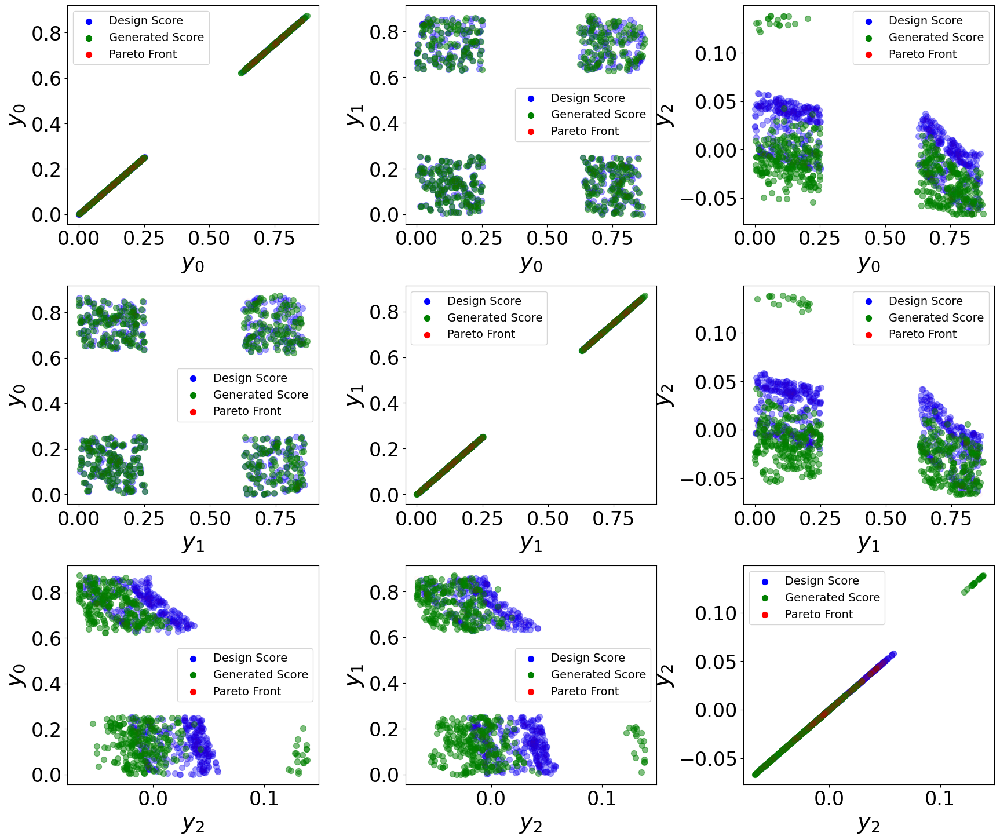

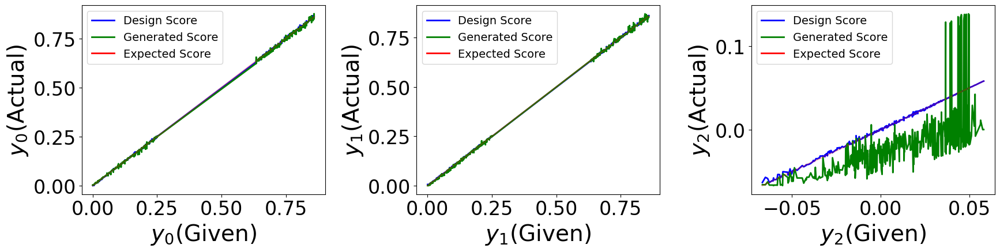

Hypervolume (100th): 10.774185
Hypervolume (D(best)): 0.000000
Ideal Hypervolume: 10.648000
y_given Hypervolume: 10.788958
pf Hypervolume: 10.788958
GD: 0.003481238646516735
GD+: 0.0014765263607454326
IGD: 0.003507406893295948
IGD+: 0.0014069721869822372
L2 dist between design score and given y: 0.07147729107899566
L2 dist between generated and given y: 0.8565493269615971
Spread for y_cand: 0.7720169348950923
Spread for y_gen: 0.793108089562389
****************************************Seed: 41*********************************************************


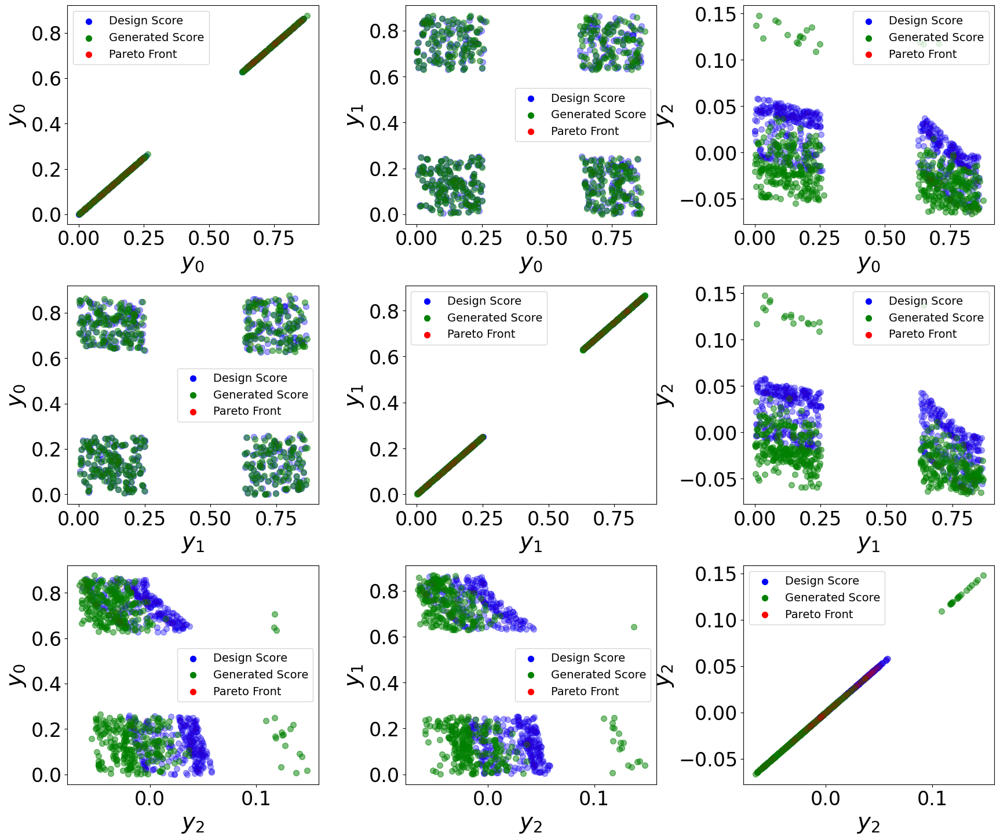

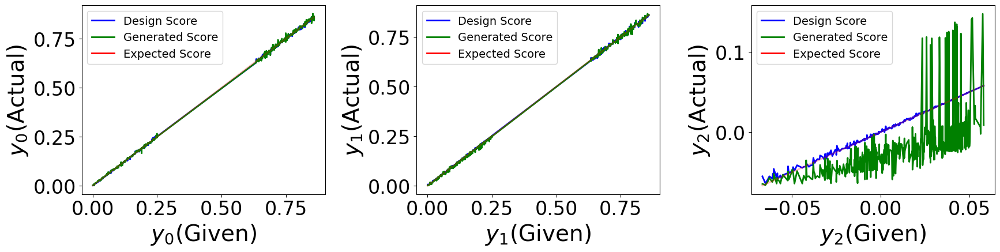

Hypervolume (100th): 10.768863
Hypervolume (D(best)): 0.000000
Ideal Hypervolume: 10.648000
y_given Hypervolume: 10.788958
pf Hypervolume: 10.788958
GD: 0.004149048672725552
GD+: 0.001685076928094309
IGD: 0.004319614207212393
IGD+: 0.001472111898794783
L2 dist between design score and given y: 0.10324890722300008
L2 dist between generated and given y: 0.9291757803965597
Spread for y_cand: 0.8356878033543703
Spread for y_gen: 0.7951660064080075
****************************************Seed: 42*********************************************************


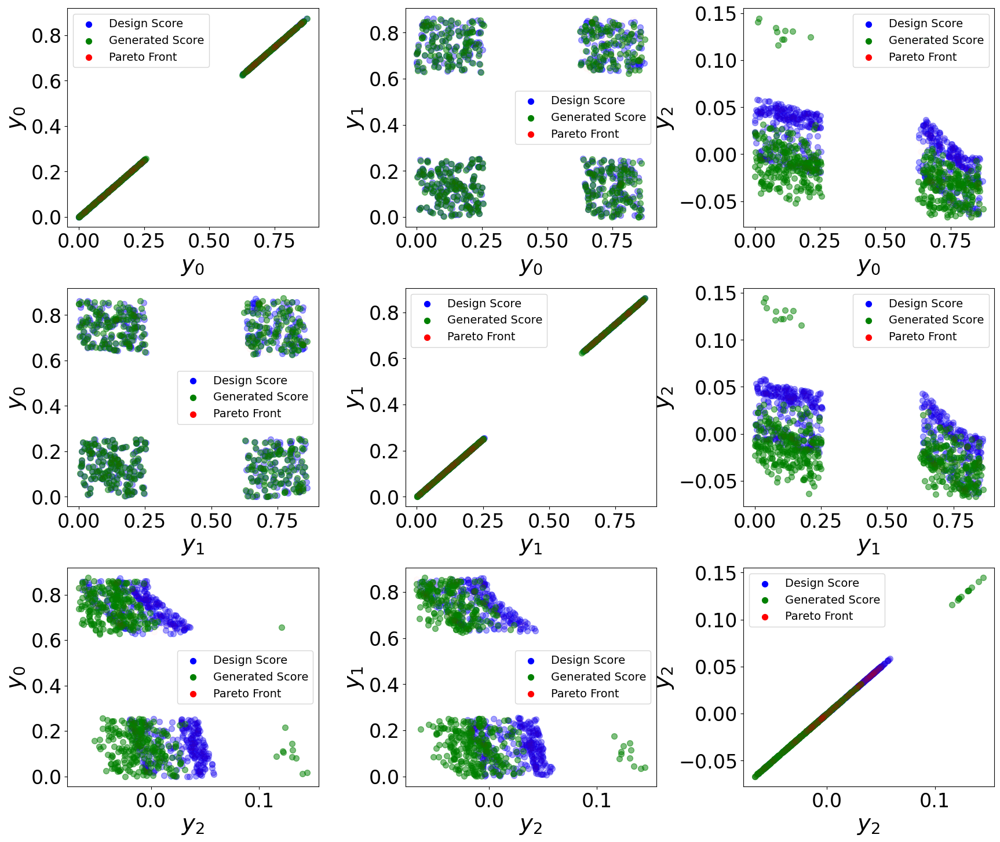

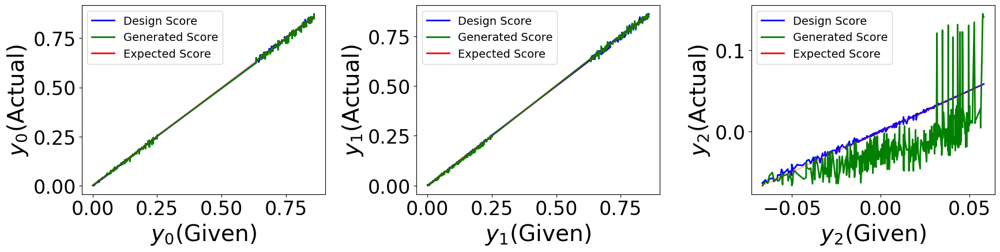

Hypervolume (100th): 10.775426
Hypervolume (D(best)): 0.000000
Ideal Hypervolume: 10.648000
y_given Hypervolume: 10.788958
pf Hypervolume: 10.788958
GD: 0.004659644927120568
GD+: 0.0018543003215353404
IGD: 0.004690039890393909
IGD+: 0.0016785122493341142
L2 dist between design score and given y: 0.12265115501836282
L2 dist between generated and given y: 0.8199823998472179
Spread for y_cand: 0.7832044699251537
Spread for y_gen: 0.7521177494597048
****************************************Seed: 43*********************************************************


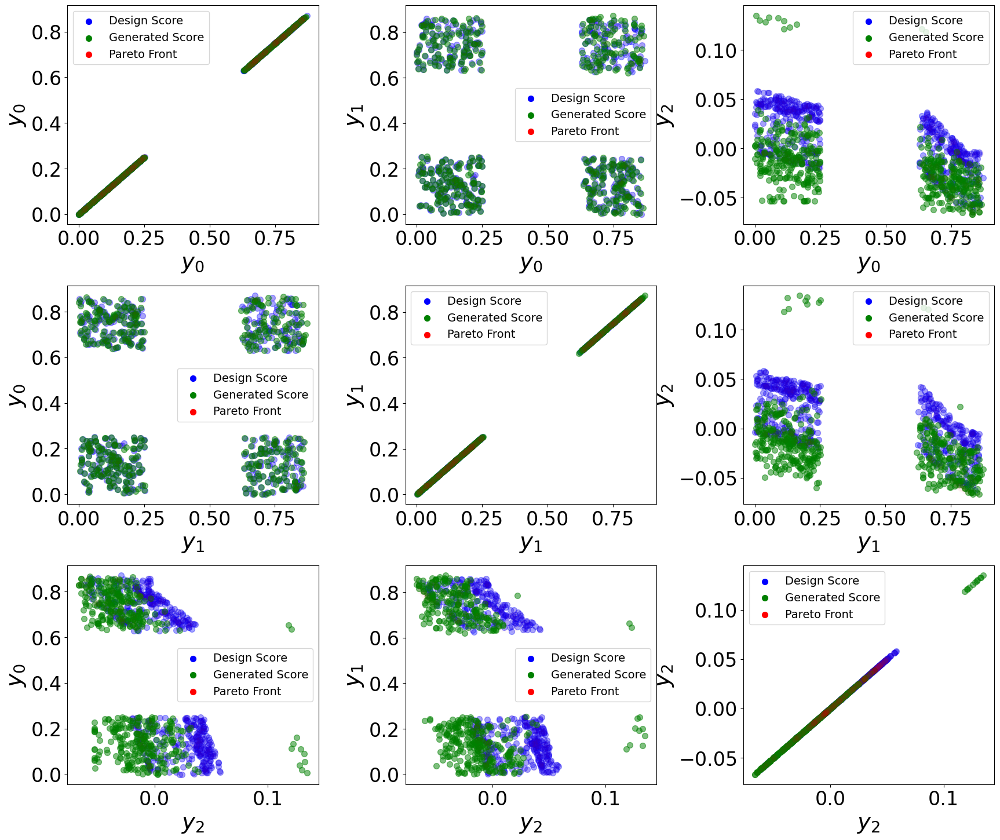

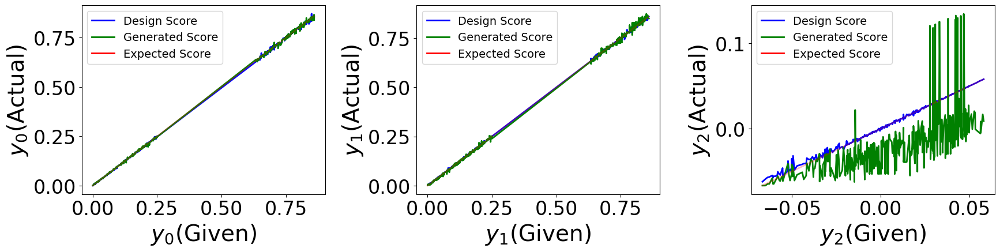

Hypervolume (100th): 10.773873
Hypervolume (D(best)): 0.000000
Ideal Hypervolume: 10.648000
y_given Hypervolume: 10.788958
pf Hypervolume: 10.788958
GD: 0.004112295880671977
GD+: 0.0017517474710468939
IGD: 0.004125502873829896
IGD+: 0.001535775009510795
L2 dist between design score and given y: 0.1003875840197927
L2 dist between generated and given y: 0.837971501798639
Spread for y_cand: 0.8052926203362591
Spread for y_gen: 0.7630792810563848


In [9]:
#This cell is to conduct conditional generation  with k = 256
if config['augment']:
    # pf = task.problem.get_pareto_front() 
    # if config['normalize_ys']:
    #     pf = task.normalize_y(pf)
    y_min = np.minimum(y_min, pf.min(axis=0))
    y_max = np.maximum(y_max, pf.max(axis=0))
    clip_min = torch.tensor(np.concatenate((x_min, y_min)))#x_lbound
    clip_max = torch.tensor(np.concatenate((x_max, y_max)))#x_ubound
else:
    clip_min = torch.tensor(x_min)
    clip_max = torch.tensor(x_max)
print(clip_dic)

config['simple_clip'] = True
# clip_min = - torch.ones_like(clip_min)*0.1
clip_dic = {'simple_clip': config['simple_clip'], 'clip_min': clip_min , 'clip_max': clip_max}
print(clip_dic)

# y_given_list  = np.linspace(0.1, 15, 100)
with fixed_random_seed(1000):
    if len(pf)<1000:
        rand_idx = list(range(len(pf)))
    else:
        rand_idx = np.random.choice(len(pf), 1000, replace=False)
y_given_list =  pf[rand_idx]
num_samples = 1000

num_steps = 200
inference_scaling_bool = True
duplicated_time = 64
description = 'resampling_nsmc'
kkk=256

seed_list = [40, 41, 42, 43]
HV_list = []
IGD_list = []

import pickle

for seed in seed_list:
    print(f"****************************************Seed: {seed}*********************************************************")
    xy_pred = {f'{n}': None for n in range(num_samples)}
    xy_scores = {f'{n}': None for n in range(num_samples)}

    all_res = {"y_given_list":y_given_list}
    all_res['denoising_step'] = num_steps
    all_res['inference_scaling_bool'] = inference_scaling_bool
    all_res['duplicated_time'] = duplicated_time
    all_res['shot_num'] = kkk 
    all_res.update(clip_dic)

    for i in y_given_list:
        y_given = torch.tensor(i) 
        res = mango_eval(
            task=task,
            forwardmodel=model,
            inverse_model=inverse_model,
            # hidden_size=config['hidden_size'],
            device='auto',
            num_samples= config['num_solutions'],
            seed=seed,
            logging_dir=logging_dir,
            ckpt_dir=config['model_save_dir'],
            augment=config['augment'],
            clip_dic=clip_dic,
            gamma=0,
            gen_condition=y_given,
            guidance=True,
            num_steps=num_steps,
            inference_scaling_bool=inference_scaling_bool,
            duplicated_time=duplicated_time,
        )
        for num_samples1 in range(res['x'].shape[0]):
            if xy_pred[f'{num_samples1}'] is None:
                xy_pred[f'{num_samples1}'] = res['x'][num_samples1]
                # xy_scores[f'{num_samples}'] = res['y_scores'][num_samples]
            else:
                xy_pred[f'{num_samples1}'] = np.vstack((xy_pred[f'{num_samples1}'], res['x'][num_samples1]))
                # xy_scores[f'{num_samples}'] = np.vstack((xy_scores[f'{num_samples}'], res['y_scores'][num_samples]))

        all_res[f'y_given_{i}'] = res

    #save all_res
    file_path = os.path.join(logging_dir, f"cond_{description}_all_res_shot{kkk}_seed{seed}.pkl")
    with open(file_path, 'wb') as f:
        pickle.dump(all_res, f)

    #get best result
    x_opt_cand, y_cand, y_gen, valid_num = get_best_result(task, res, xy_pred, y_given_list, clip_max, clip_min, kkk, config)

    np.save(f'{logging_dir}/cond_{description}_res_x_opt_cand_shot{kkk}_seed{seed}.npy', x_opt_cand)
    np.save(f'{logging_dir}/cond_{description}_res_y_cand_shot{kkk}_seed{seed}.npy', y_cand)
    np.save(f'{logging_dir}/cond_{description}_res_y_gen_shot{kkk}_seed{seed}.npy', y_gen)
 

    #plot scatterr
    plot_scatter(y_cand, y_gen, y_given_list, description, logging_dir, kkk, seed)
    #plot line
    plot_line(y_cand, y_gen, y_given_list, description, logging_dir, kkk, seed)
    #save indicators
    save_indicators(HV_list, IGD_list, y_cand, y_gen, y_given_list, pf, description, logging_dir, kkk, seed, config, task)

In [10]:
print(f"Average Hypervolume: {np.mean(HV_list):.4f} ± {np.std(HV_list):.4f}")
print(f"Average IGD: {np.mean(IGD_list):.4f} ± {np.std(IGD_list):.4f}")

Average Hypervolume: 10.7731 ± 0.0025
Average IGD: 0.0042 ± 0.0004


{'simple_clip': True, 'clip_min': tensor([ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
        -1.8005e-08, -5.1119e-07, -6.6741e-02], dtype=torch.float64), 'clip_max': tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       dtype=torch.float64)}
{'simple_clip': True, 'clip_min': tensor([ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
        -1.8005e-08, -5.1119e-07, -6.6741e-02], dtype=torch.float64), 'clip_max': tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       dtype=torch.float64)}
****************************************Seed: 40*********************************************************


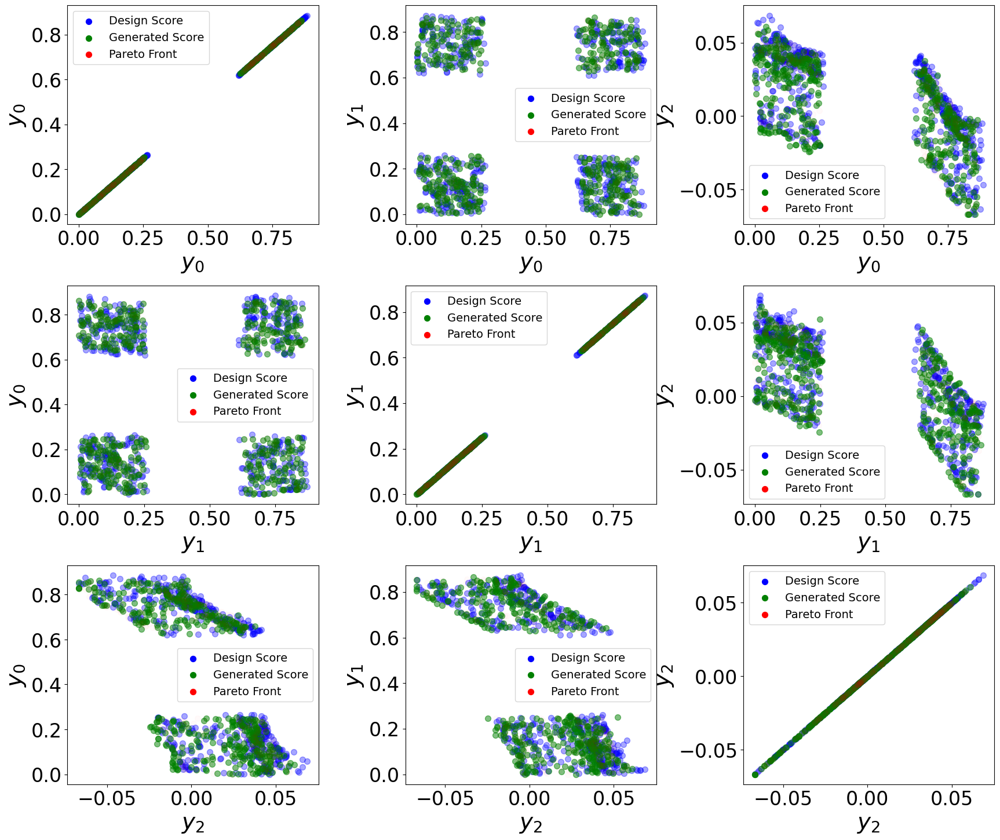

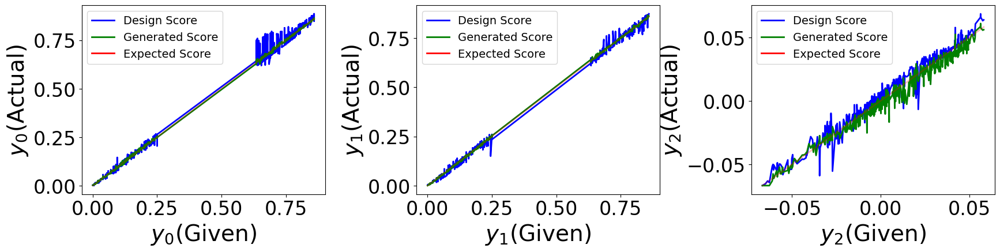

Hypervolume (100th): 10.782825
Hypervolume (D(best)): 0.000000
Ideal Hypervolume: 10.648000
y_given Hypervolume: 10.788958
pf Hypervolume: 10.788958
GD: 0.011783917274584563
GD+: 0.004958650172312002
IGD: 0.011636640317004503
IGD+: 0.0037512335425202888
L2 dist between design score and given y: 0.5770871939157394
L2 dist between generated and given y: 0.11267930467336475
Spread for y_cand: 0.8437364797028336
Spread for y_gen: 0.8206711225109742
****************************************Seed: 41*********************************************************


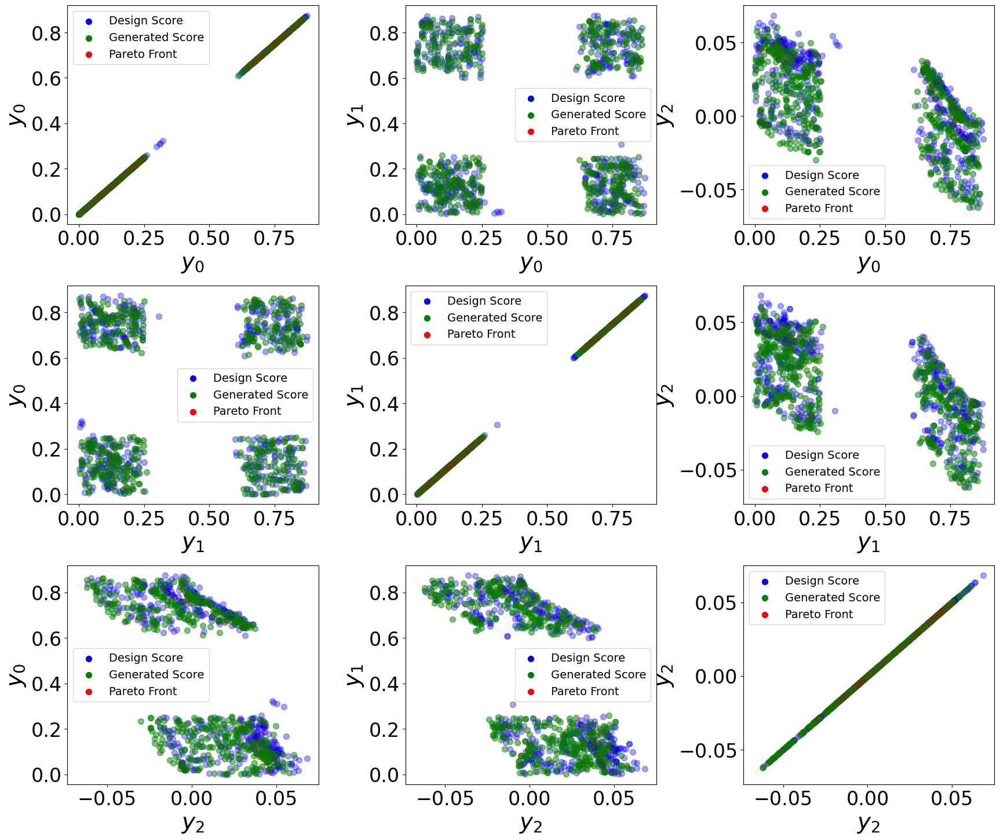

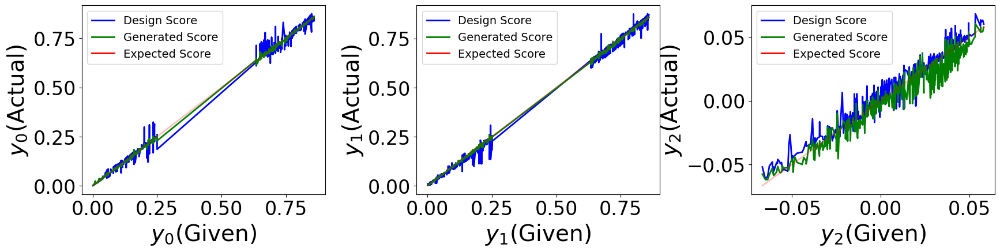

Hypervolume (100th): 10.777839
Hypervolume (D(best)): 0.000000
Ideal Hypervolume: 10.648000
y_given Hypervolume: 10.788958
pf Hypervolume: 10.788958
GD: 0.011292941284113515
GD+: 0.004677995999513149
IGD: 0.011158633510332108
IGD+: 0.0034430866253893706
L2 dist between design score and given y: 0.545881823810954
L2 dist between generated and given y: 0.1928110583881853
Spread for y_cand: 0.8474841274090711
Spread for y_gen: 0.7990111768508619
****************************************Seed: 42*********************************************************


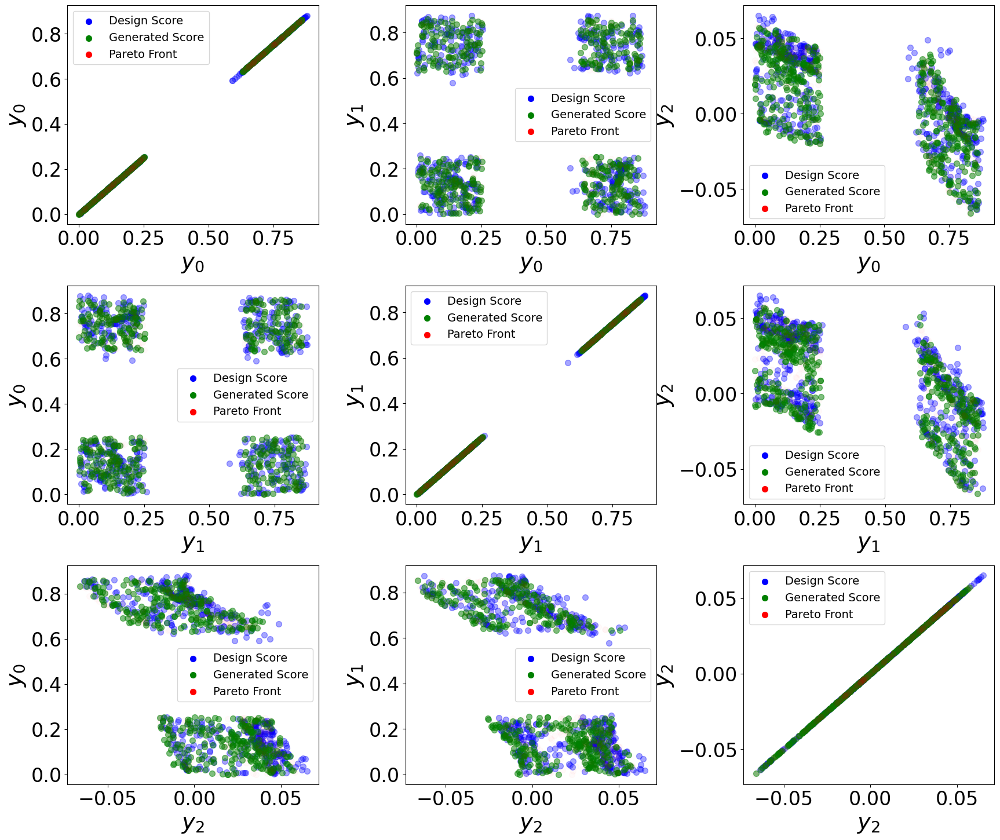

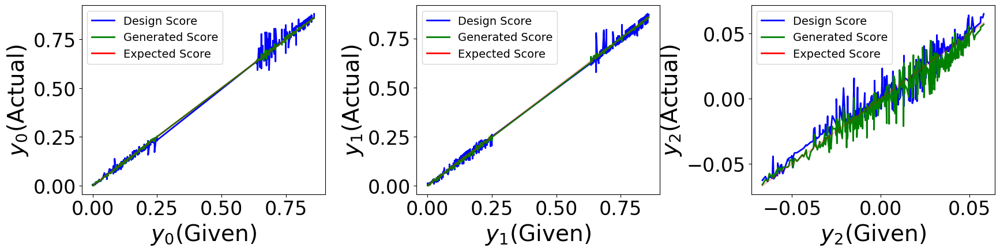

Hypervolume (100th): 10.769592
Hypervolume (D(best)): 0.000000
Ideal Hypervolume: 10.648000
y_given Hypervolume: 10.788958
pf Hypervolume: 10.788958
GD: 0.011683306568938182
GD+: 0.004598765345980905
IGD: 0.012114532343583709
IGD+: 0.003282209510292624
L2 dist between design score and given y: 0.5779768038465705
L2 dist between generated and given y: 0.1806327833992206
Spread for y_cand: 0.8221449617355483
Spread for y_gen: 0.8072538612734116
****************************************Seed: 43*********************************************************


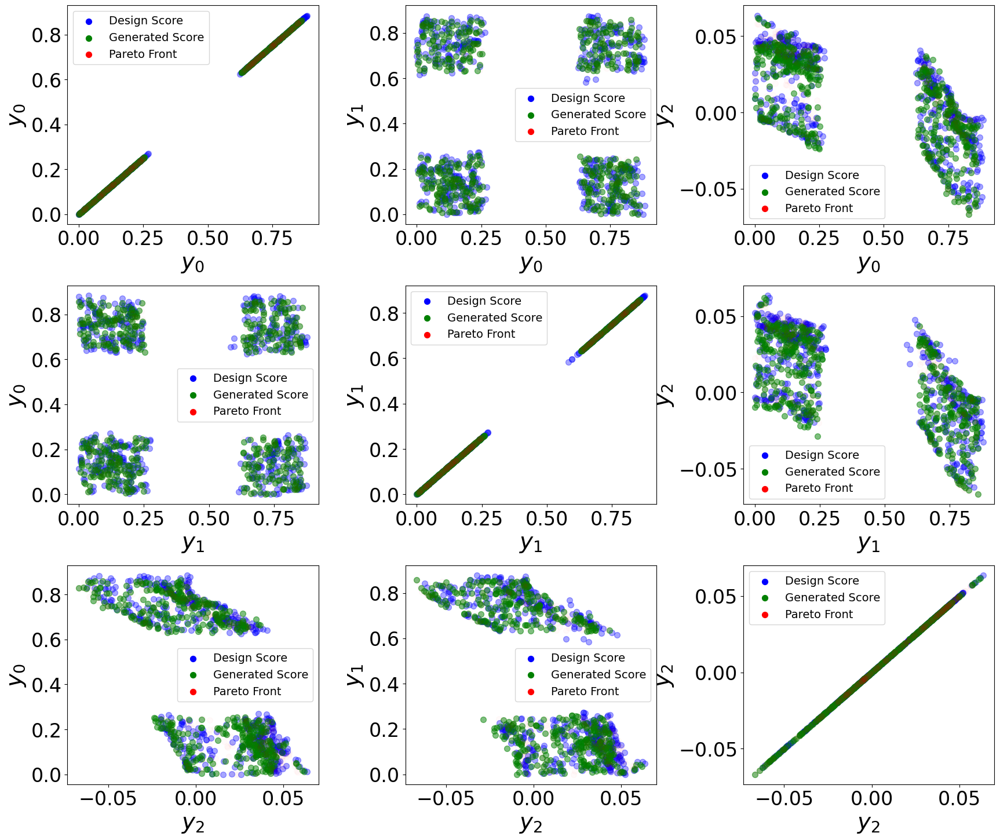

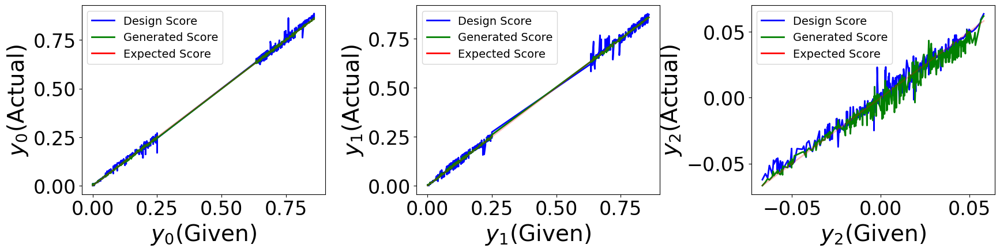

Hypervolume (100th): 10.784652
Hypervolume (D(best)): 0.000000
Ideal Hypervolume: 10.648000
y_given Hypervolume: 10.788958
pf Hypervolume: 10.788958
GD: 0.011199621832389478
GD+: 0.004339620536856256
IGD: 0.011636175283691723
IGD+: 0.0034865924049312805
L2 dist between design score and given y: 0.40428994940035035
L2 dist between generated and given y: 0.1291725663167038
Spread for y_cand: 0.7584832586527009
Spread for y_gen: 0.7564048436036225


In [11]:
#This cell is to conduct conditional generation  with k = 1
if config['augment']:
    # pf = task.problem.get_pareto_front() 
    # if config['normalize_ys']:
    #     pf = task.normalize_y(pf)
    y_min = np.minimum(y_min, pf.min(axis=0))
    y_max = np.maximum(y_max, pf.max(axis=0))
    clip_min = torch.tensor(np.concatenate((x_min, y_min)))#x_lbound
    clip_max = torch.tensor(np.concatenate((x_max, y_max)))#x_ubound
else:
    clip_min = torch.tensor(x_min)
    clip_max = torch.tensor(x_max)
print(clip_dic)

config['simple_clip'] = True
# clip_min = - torch.ones_like(clip_min)*0.1
clip_dic = {'simple_clip': config['simple_clip'], 'clip_min': clip_min , 'clip_max': clip_max}
print(clip_dic)

# y_given_list  = np.linspace(0.1, 15, 100)
with fixed_random_seed(1000):
    if len(pf)<1000:
        rand_idx = list(range(len(pf)))
    else:
        rand_idx = np.random.choice(len(pf), 1000, replace=False)
y_given_list =  pf[rand_idx]
num_samples = 1000

num_steps = 200
inference_scaling_bool = True
duplicated_time = 64
description = 'resampling_nsmc'
kkk=1

seed_list = [40, 41, 42, 43]
HV_list = []
IGD_list = []

import pickle

for seed in seed_list:
    print(f"****************************************Seed: {seed}*********************************************************")
    xy_pred = {f'{n}': None for n in range(num_samples)}
    xy_scores = {f'{n}': None for n in range(num_samples)}

    all_res = {"y_given_list":y_given_list}
    all_res['denoising_step'] = num_steps
    all_res['inference_scaling_bool'] = inference_scaling_bool
    all_res['duplicated_time'] = duplicated_time
    all_res['shot_num'] = kkk 
    all_res.update(clip_dic)

    for i in y_given_list:
        y_given = torch.tensor(i) 
        res = mango_eval(
            task=task,
            forwardmodel=model,
            inverse_model=inverse_model,
            # hidden_size=config['hidden_size'],
            device='auto',
            num_samples= config['num_solutions'],
            seed=seed,
            logging_dir=logging_dir,
            ckpt_dir=config['model_save_dir'],
            augment=config['augment'],
            clip_dic=clip_dic,
            gamma=0,
            gen_condition=y_given,
            guidance=True,
            num_steps=num_steps,
            inference_scaling_bool=inference_scaling_bool,
            duplicated_time=duplicated_time,
        )
        for num_samples1 in range(res['x'].shape[0]):
            if xy_pred[f'{num_samples1}'] is None:
                xy_pred[f'{num_samples1}'] = res['x'][num_samples1]
                # xy_scores[f'{num_samples}'] = res['y_scores'][num_samples]
            else:
                xy_pred[f'{num_samples1}'] = np.vstack((xy_pred[f'{num_samples1}'], res['x'][num_samples1]))
                # xy_scores[f'{num_samples}'] = np.vstack((xy_scores[f'{num_samples}'], res['y_scores'][num_samples]))

        all_res[f'y_given_{i}'] = res

    #save all_res
    file_path = os.path.join(logging_dir, f"cond_{description}_all_res_shot{kkk}_seed{seed}.pkl")
    with open(file_path, 'wb') as f:
        pickle.dump(all_res, f)

    #get best result
    x_opt_cand, y_cand, y_gen, valid_num = get_best_result(task, res, xy_pred, y_given_list, clip_max, clip_min, kkk, config)

    np.save(f'{logging_dir}/cond_{description}_res_x_opt_cand_shot{kkk}_seed{seed}.npy', x_opt_cand)
    np.save(f'{logging_dir}/cond_{description}_res_y_cand_shot{kkk}_seed{seed}.npy', y_cand)
    np.save(f'{logging_dir}/cond_{description}_res_y_gen_shot{kkk}_seed{seed}.npy', y_gen)
 

    #plot scatterr
    plot_scatter(y_cand, y_gen, y_given_list, description, logging_dir, kkk, seed)
    #plot line
    plot_line(y_cand, y_gen, y_given_list, description, logging_dir, kkk, seed)
    #save indicators
    save_indicators(HV_list, IGD_list, y_cand, y_gen, y_given_list, pf, description, logging_dir, kkk, seed, config, task)

In [12]:
print(f"Average Hypervolume: {np.mean(HV_list):.4f} ± {np.std(HV_list):.4f}")
print(f"Average IGD: {np.mean(IGD_list):.4f} ± {np.std(IGD_list):.4f}")

Average Hypervolume: 10.7787 ± 0.0058
Average IGD: 0.0116 ± 0.0003
